## Setup

In [2]:
# !pip install -q transformers
# !pip install -q sentencepiece
# !pip install -q jiwer
# !pip install -q datasets
# !pip install -q evaluate
# !pip install -q -U accelerate

# !pip install -q matplotlib
# !pip install -q protobuf==3.20.1
# !pip install -q tensorboard

## Imports

In [3]:
import os
import torch
import evaluate
import numpy as np
import pandas as pd
import glob as glob
import torch.optim as optim
import matplotlib.pyplot as plt
import torchvision.transforms as transforms

from PIL import Image
from zipfile import ZipFile
from tqdm import tqdm
from dataclasses import dataclass
from torch.utils.data import Dataset
from urllib.request import urlretrieve
from transformers import (
    VisionEncoderDecoderModel, 
    TrOCRProcessor,
    Seq2SeqTrainer,
    Seq2SeqTrainingArguments,
    default_data_collator
)

block_plot = False
plt.rcParams['figure.figsize'] = (12, 9)

c:\Users\Rijil Raj\OneDrive\Desktop\VISIO Project\venv\Lib\site-packages\tqdm\auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [4]:
bold = f"\033[1m"
reset = f"\033[0m"

In [5]:
def seed_everything(seed_value):
    np.random.seed(seed_value)
    torch.manual_seed(seed_value)
    torch.cuda.manual_seed_all(seed_value)
    torch.backends.cudnn.deterministic = True
    torch.backends.cudnn.benchmark = False

seed_everything(42)

In [6]:
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

## Download and Extract the Dataset

In [7]:
def download_and_unzip(url, save_path):
    print(f"Downloading and extracting assets....", end="")

    # Downloading zip file using urllib package.
    urlretrieve(url, save_path)

    try:
        # Extracting zip file using the zipfile package.
        with ZipFile(save_path) as z:
            # Extract ZIP file contents in the same directory.
            z.extractall(os.path.split(save_path)[0])

        print("Done")

    except Exception as e:
        print("\nInvalid file.", e)

In [8]:
URL = r"https://www.dropbox.com/scl/fi/vyvr7jbdvu8o174mbqgde/scut_data.zip?rlkey=fs8axkpxunwu6if9a2su71kxs&dl=1"
asset_zip_path = os.path.join(os.getcwd(), "scut_data.zip")
# Download if asset ZIP does not exist.
if not os.path.exists(asset_zip_path):
    download_and_unzip(URL, asset_zip_path)

## Training and Dataset Configurations

In [9]:
@dataclass(frozen=True)
class TrainingConfig:
    BATCH_SIZE:    int = 1
    EPOCHS:        int = 5
    LEARNING_RATE: float = 0.00005

@dataclass(frozen=True)
class DatasetConfig:
    DATA_ROOT:     str = 'scut_data'

@dataclass(frozen=True)
class ModelConfig:
    MODEL_NAME: str = 'microsoft/trocr-small-printed'

## The SCUT Dataset

The SCUT dataset that we are using contains a total of 7703 images. Out of these 6052 are training samples and 1651 are validation samples. Here is the directory structure of the `scut_data` directory after downloading and extracting it.

```
scut_data/
├── scut_train
├── scut_test
├── scut_train.txt
└── scut_test.txt
```

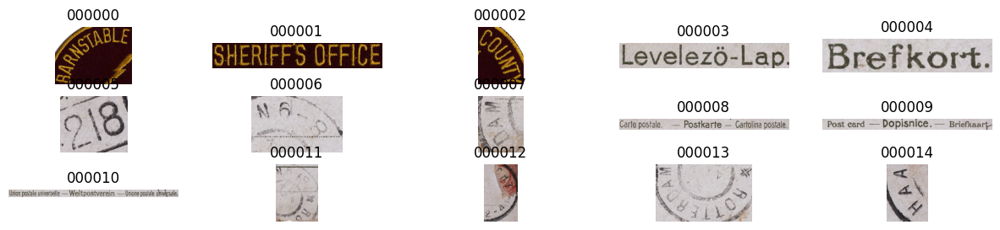

In [10]:
def visualize(dataset_path):
    plt.figure(figsize=(15, 3))
    for i in range(15):
        plt.subplot(3, 5, i+1)
        all_images = os.listdir(f"{dataset_path}/scut_train")
        image = plt.imread(f"{dataset_path}/scut_train/{all_images[i]}")
        plt.imshow(image)
        plt.axis('off')
        plt.title(all_images[i].split('.')[0])
    plt.show()

visualize(DatasetConfig.DATA_ROOT)

## Prepare Dataset

In [11]:
train_df = pd.read_fwf(
    os.path.join(DatasetConfig.DATA_ROOT, 'scut_train.txt'), header=None
)
train_df.rename(columns={0: 'file_name', 1: 'text'}, inplace=True)
test_df = pd.read_fwf(
    os.path.join(DatasetConfig.DATA_ROOT, 'scut_test.txt'), header=None
)
test_df.rename(columns={0: 'file_name', 1: 'text'}, inplace=True)

In [12]:
train_df.head()

,file_name,text
0,000000.jpg,BARNSTABLE
1,000001.jpg,SHERIFF'S OFFICE
2,000002.jpg,COUNTY
3,000003.jpg,Levelezo-Lap.
4,000004.jpg,Brefkort


In [13]:
test_df.head()

,file_name,text
0,006052.jpg,ty Starts with Education
1,006053.jpg,Cardi's
2,006054.jpg,YOU THE BUSINESS SIDE OF GREEN
3,006055.jpg,hat is
4,006056.jpg,all of us


In [14]:
# Augmentations.
train_transforms = transforms.Compose([
    transforms.ColorJitter(brightness=.5, hue=.3),
    transforms.GaussianBlur(kernel_size=(5, 9), sigma=(0.1, 5)),
])

In [15]:
class CustomOCRDataset(Dataset):
    def __init__(self, root_dir, df, processor, max_target_length=128):
        self.root_dir = root_dir
        self.df = df
        self.processor = processor
        self.max_target_length = max_target_length

    def __len__(self):
        return len(self.df)

    def __getitem__(self, idx):
        # The image file name.
        file_name = self.df['file_name'][idx]
        # The text (label).
        text = self.df['text'][idx]
        # Read the image, apply augmentations, and get the transformed pixels.
        image = Image.open(self.root_dir + file_name).convert('RGB')
        image = train_transforms(image)
        pixel_values = self.processor(image, return_tensors='pt').pixel_values
        # Pass the text through the tokenizer and get the labels,
        # i.e. tokenized labels.
        labels = self.processor.tokenizer(
            text,
            padding='max_length',
            max_length=self.max_target_length
        ).input_ids
        # We are using -100 as the padding token.
        labels = [label if label != self.processor.tokenizer.pad_token_id else -100 for label in labels]
        encoding = {"pixel_values": pixel_values.squeeze(), "labels": torch.tensor(labels)}
        return encoding

In [16]:
processor = TrOCRProcessor.from_pretrained(ModelConfig.MODEL_NAME)
train_dataset = CustomOCRDataset(
    root_dir=os.path.join(DatasetConfig.DATA_ROOT, 'scut_train/'),
    df=train_df,
    processor=processor
)
valid_dataset = CustomOCRDataset(
    root_dir=os.path.join(DatasetConfig.DATA_ROOT, 'scut_test/'),
    df=test_df,
    processor=processor
)

Using a slow image processor as `use_fast` is unset and a slow processor was saved with this model. `use_fast=True` will be the default behavior in v4.52, even if the model was saved with a slow processor. This will result in minor differences in outputs. You'll still be able to use a slow processor with `use_fast=False`.


In [17]:
print("Number of training examples:", len(train_dataset))
print("Number of validation examples:", len(valid_dataset))

Number of training examples: 6052
Number of validation examples: 1651


In [18]:
encoding = train_dataset[0]
for k,v in encoding.items():
    print(k, v.shape)

pixel_values torch.Size([3, 384, 384])
labels torch.Size([128])


(np.float64(-0.5), np.float64(797.5), np.float64(598.5), np.float64(-0.5))

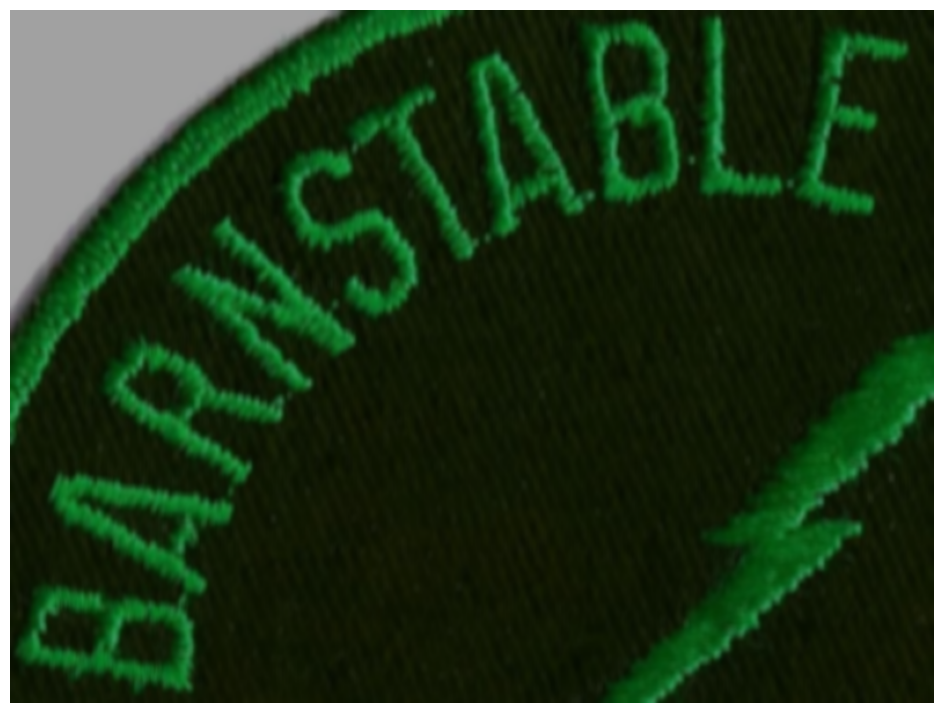

In [19]:
image = Image.open(train_dataset.root_dir + train_df['file_name'][0]).convert("RGB")
image = train_transforms(image)
plt.imshow(image)
plt.axis('off')

In [20]:
labels = encoding['labels']
labels[labels == -100] = processor.tokenizer.pad_token_id
label_str = processor.decode(labels, skip_special_tokens=True)
print(label_str)

BARNSTABLE


## Initialize the Model

In [21]:
model = VisionEncoderDecoderModel.from_pretrained(ModelConfig.MODEL_NAME)
model.gradient_checkpointing_enable()
model.to(device)
print(model)
# Total parameters and trainable parameters.
total_params = sum(p.numel() for p in model.parameters())
print(f"{total_params:,} total parameters.")
total_trainable_params = sum(
    p.numel() for p in model.parameters() if p.requires_grad)
print(f"{total_trainable_params:,} training parameters.")



Some weights of VisionEncoderDecoderModel were not initialized from the model checkpoint at microsoft/trocr-small-printed and are newly initialized: ['encoder.pooler.dense.bias', 'encoder.pooler.dense.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


VisionEncoderDecoderModel(
  (encoder): DeiTModel(
    (embeddings): DeiTEmbeddings(
      (patch_embeddings): DeiTPatchEmbeddings(
        (projection): Conv2d(3, 384, kernel_size=(16, 16), stride=(16, 16))
      )
      (dropout): Dropout(p=0.0, inplace=False)
    )
    (encoder): DeiTEncoder(
      (layer): ModuleList(
        (0-11): 12 x DeiTLayer(
          (attention): DeiTAttention(
            (attention): DeiTSelfAttention(
              (query): Linear(in_features=384, out_features=384, bias=True)
              (key): Linear(in_features=384, out_features=384, bias=True)
              (value): Linear(in_features=384, out_features=384, bias=True)
            )
            (output): DeiTSelfOutput(
              (dense): Linear(in_features=384, out_features=384, bias=True)
              (dropout): Dropout(p=0.0, inplace=False)
            )
          )
          (intermediate): DeiTIntermediate(
            (dense): Linear(in_features=384, out_features=1536, bias=True)
        

## Model Configurations

In [22]:
# Set special tokens used for creating the decoder_input_ids from the labels.
model.config.decoder_start_token_id = processor.tokenizer.cls_token_id
model.config.pad_token_id = processor.tokenizer.pad_token_id
# Set Correct vocab size.
model.config.vocab_size = model.config.decoder.vocab_size
model.config.eos_token_id = processor.tokenizer.sep_token_id

model.config.max_length = 64
model.config.early_stopping = True
model.config.no_repeat_ngram_size = 3
model.config.length_penalty = 2.0
model.config.num_beams = 4

We use the AdamW optimizer here with a weight decay of 0.0005.

In [23]:
optimizer = optim.AdamW(
    model.parameters(), lr=TrainingConfig.LEARNING_RATE, weight_decay=0.0005
)

## Evaluation Metric

In [24]:
cer_metric = evaluate.load('cer')

Using the latest cached version of the module from C:\Users\Rijil Raj\.cache\huggingface\modules\evaluate_modules\metrics\evaluate-metric--cer\87ffabb91696e0a8647c7685d414f639d31fb1eed705afe32e5ab03f4692245c (last modified on Mon Dec 22 20:51:35 2025) since it couldn't be found locally at evaluate-metric--cer, or remotely on the Hugging Face Hub.


ModuleNotFoundError: No module named 'jiwer'

In [ ]:
def compute_cer(pred):
    labels_ids = pred.label_ids
    pred_ids = pred.predictions

    pred_str = processor.batch_decode(pred_ids, skip_special_tokens=True)
    labels_ids[labels_ids == -100] = processor.tokenizer.pad_token_id
    label_str = processor.batch_decode(labels_ids, skip_special_tokens=True)

    cer = cer_metric.compute(predictions=pred_str, references=label_str)

    return {"cer": cer}

## Training and Validation Loops

In [ ]:
training_args = Seq2SeqTrainingArguments(
    predict_with_generate=True,
    do_train=True,
    do_eval=True,

    per_device_train_batch_size=TrainingConfig.BATCH_SIZE,
    per_device_eval_batch_size=TrainingConfig.BATCH_SIZE,

    gradient_accumulation_steps=4,
    
    fp16=True,
    output_dir='seq2seq_model_printed/',
    
    save_total_limit=5,
    report_to='tensorboard',
    num_train_epochs=TrainingConfig.EPOCHS
)

In [ ]:
# Initialize trainer.
trainer = Seq2SeqTrainer(
    model=model,
    tokenizer=processor.feature_extractor,
    args=training_args,
    compute_metrics=compute_cer,
    train_dataset=train_dataset,
    eval_dataset=valid_dataset,
    data_collator=default_data_collator
)

c:\Users\Rijil Raj\OneDrive\Desktop\VISIO Project\venv\Lib\site-packages\transformers\models\trocr\processing_trocr.py:139: FutureWarning: `feature_extractor` is deprecated and will be removed in v5. Use `image_processor` instead.
  warnings.warn(
C:\Users\Rijil Raj\AppData\Local\Temp\ipykernel_28400\3037518232.py:2: FutureWarning: `tokenizer` is deprecated and will be removed in version 5.0.0 for `Seq2SeqTrainer.__init__`. Use `processing_class` instead.
  trainer = Seq2SeqTrainer(


## Train

In [ ]:
import torch
torch.cuda.empty_cache()

res = trainer.train()

`loss_type=None` was set in the config but it is unrecognized. Using the default loss: `ForCausalLMLoss`.


Step,Training Loss
500,4.763300
1000,4.062900
1500,3.823000
2000,3.346000
2500,3.248100
3000,3.180700
3500,2.820600
4000,2.745900
4500,2.584600
5000,2.373900


c:\Users\Rijil Raj\OneDrive\Desktop\VISIO Project\venv\Lib\site-packages\transformers\modeling_utils.py:3918: UserWarning: Moving the following attributes in the config to the generation config: {'max_length': 64, 'early_stopping': True, 'num_beams': 4, 'length_penalty': 2.0, 'no_repeat_ngram_size': 3}. You are seeing this warning because you've set generation parameters in the model config, as opposed to in the generation config.
  warnings.warn(


In [ ]:
res

TrainOutput(global_step=7565, training_loss=2.8740872561498265, metrics={'train_runtime': 170591.1593, 'train_samples_per_second': 0.177, 'train_steps_per_second': 0.044, 'total_flos': 3.619843041310802e+18, 'train_loss': 2.8740872561498265, 'epoch': 5.0})

## Inference

In [ ]:
device = torch.device('cuda:0' if torch.cuda.is_available else 'cpu')

NameError: name 'torch' is not defined

In [ ]:
processor = TrOCRProcessor.from_pretrained("microsoft/trocr-base-printed")
model = VisionEncoderDecoderModel.from_pretrained(
    "trocr_curved_finetuned"
).to(device).eval()

In [ ]:
def read_and_show(image_path):
    """
    :param image_path: String, path to the input image.

    Returns:
        image: PIL Image.
    """
    image = Image.open(image_path).convert('RGB')
    return image

In [ ]:
def ocr(image, processor, model):
    """
    :param image: PIL Image.
    :param processor: Huggingface OCR processor.
    :param model: Huggingface OCR model.

    Returns:
        generated_text: the OCR'd text string.
    """
    # We can directly perform OCR on cropped images.
    pixel_values = processor(image, return_tensors='pt').pixel_values.to(device)
    generated_ids = model.generate(pixel_values)
    generated_text = processor.batch_decode(generated_ids, skip_special_tokens=True)[0]
    return generated_text

In [ ]:
def eval_new_data(
    data_path=os.path.join(DatasetConfig.DATA_ROOT, 'scut_test', '*'),
    num_samples=50
):
    image_paths = glob.glob(data_path)
    for i, image_path in tqdm(enumerate(image_paths), total=len(image_paths)):
        if i == num_samples:
            break
        image = read_and_show(image_path)
        text = ocr(image, processor, model)
        plt.figure(figsize=(7, 4))
        plt.imshow(image)
        plt.title(text)
        plt.axis('off')
        plt.show()

  0%|          | 0/1651 [00:00<?, ?it/s]

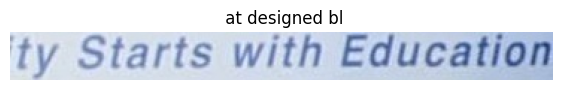

  0%|          | 1/1651 [00:03<1:36:55,  3.52s/it]

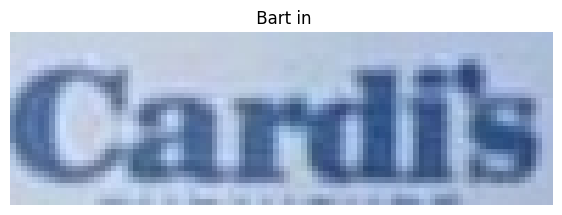

  0%|          | 2/1651 [00:03<47:06,  1.71s/it]  

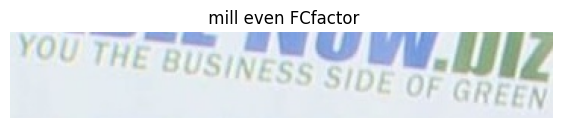

  0%|          | 3/1651 [00:04<33:49,  1.23s/it]

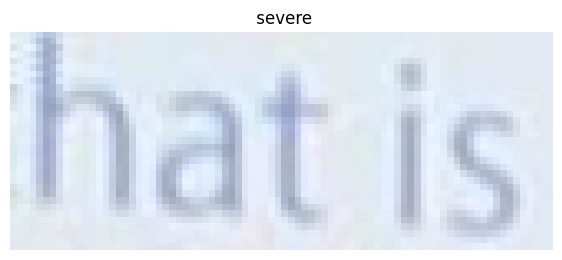

  0%|          | 4/1651 [00:04<24:26,  1.12it/s]

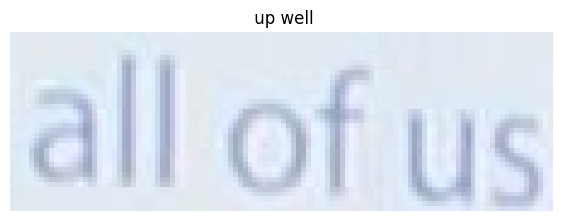

  0%|          | 5/1651 [00:05<18:05,  1.52it/s]

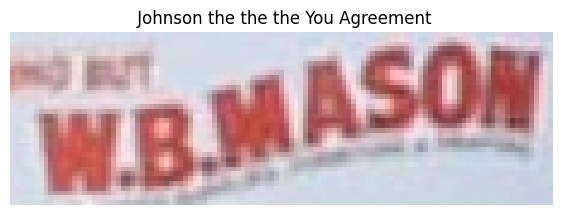

  0%|          | 6/1651 [00:05<15:56,  1.72it/s]

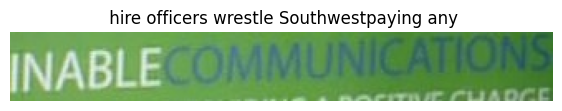

  0%|          | 7/1651 [00:06<16:17,  1.68it/s]

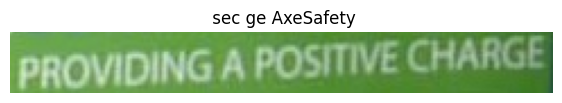

  0%|          | 8/1651 [00:06<14:09,  1.93it/s]

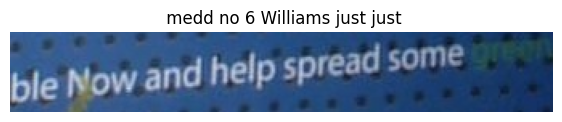

  1%|          | 9/1651 [00:07<14:24,  1.90it/s]

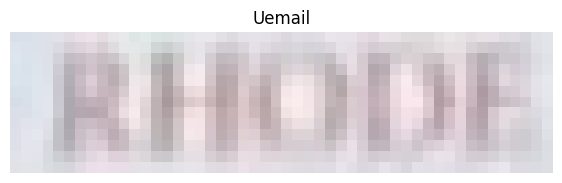

  1%|          | 10/1651 [00:07<12:08,  2.25it/s]

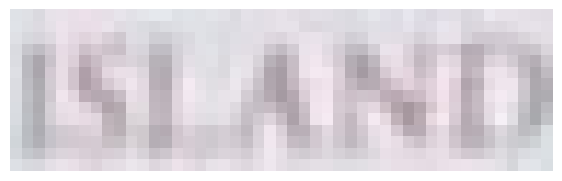

  1%|          | 11/1651 [00:07<10:09,  2.69it/s]

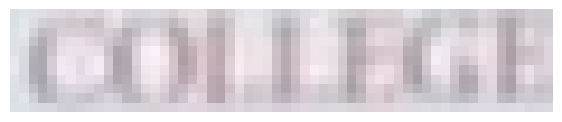

  1%|          | 12/1651 [00:07<08:36,  3.17it/s]

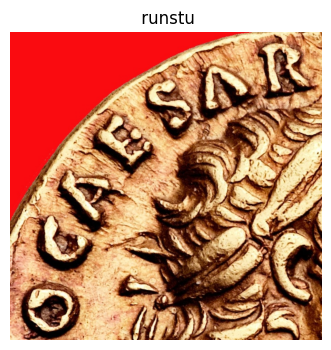

  1%|          | 13/1651 [00:08<08:34,  3.18it/s]

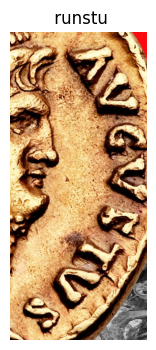

  1%|          | 14/1651 [00:08<08:21,  3.26it/s]

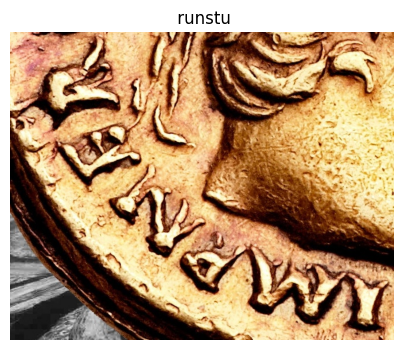

  1%|          | 15/1651 [00:08<08:21,  3.26it/s]

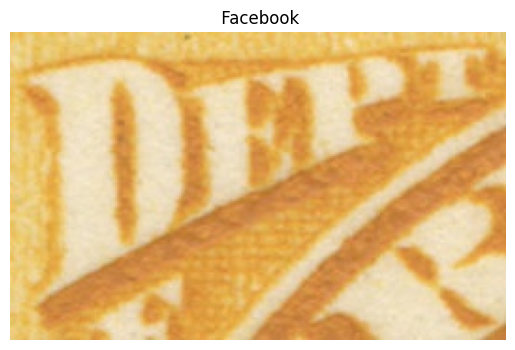

  1%|          | 16/1651 [00:09<08:31,  3.19it/s]

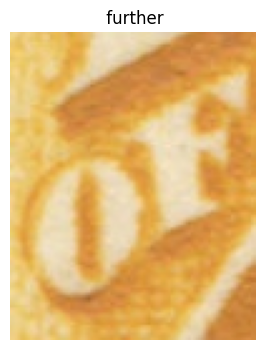

  1%|          | 17/1651 [00:09<07:50,  3.47it/s]

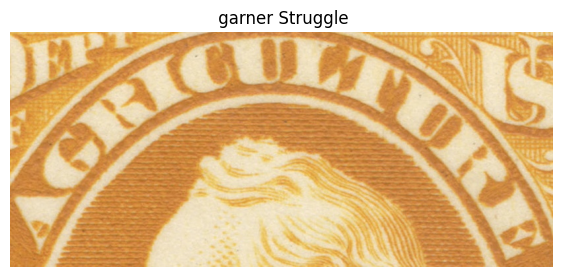

  1%|          | 18/1651 [00:09<08:13,  3.31it/s]

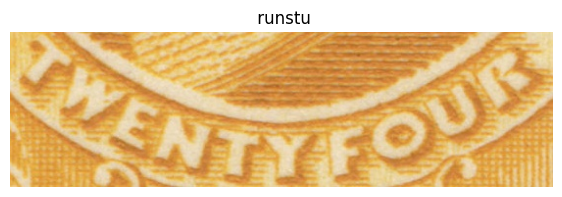

  1%|          | 19/1651 [00:09<08:12,  3.31it/s]

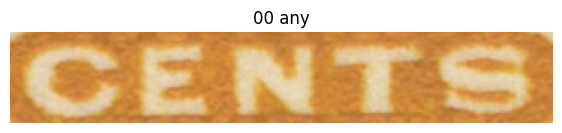

  1%|          | 20/1651 [00:10<08:03,  3.37it/s]

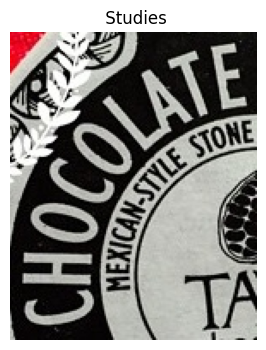

  1%|▏         | 21/1651 [00:10<07:53,  3.44it/s]

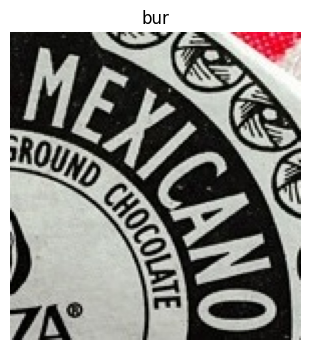

  1%|▏         | 22/1651 [00:10<07:49,  3.47it/s]

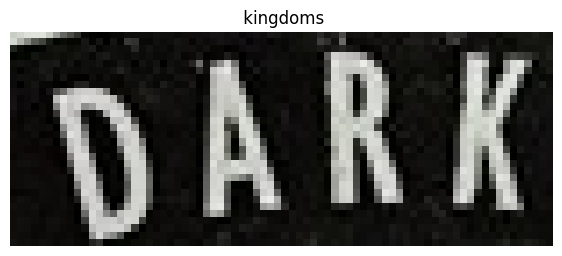

  1%|▏         | 23/1651 [00:11<07:32,  3.60it/s]

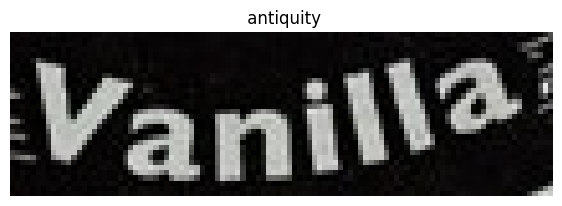

  1%|▏         | 24/1651 [00:11<07:02,  3.85it/s]

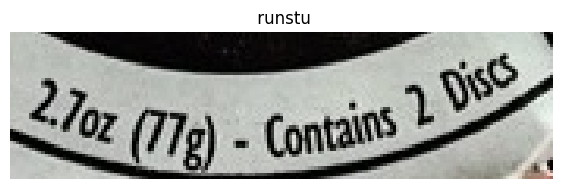

  2%|▏         | 25/1651 [00:11<08:46,  3.09it/s]

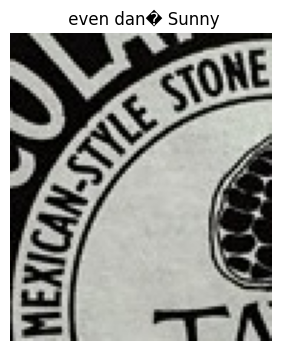

  2%|▏         | 26/1651 [00:12<09:05,  2.98it/s]

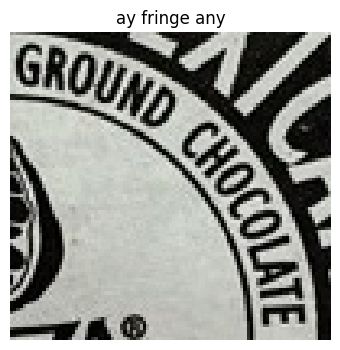

  2%|▏         | 27/1651 [00:12<08:53,  3.05it/s]

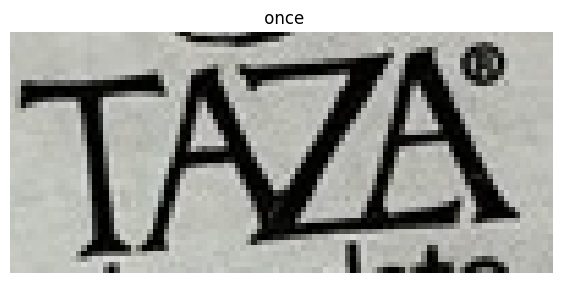

  2%|▏         | 28/1651 [00:12<08:09,  3.31it/s]

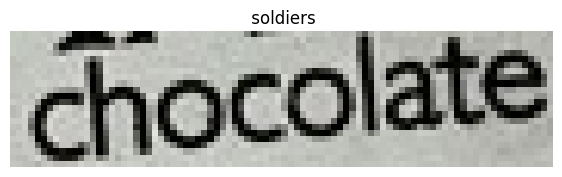

  2%|▏         | 29/1651 [00:12<07:15,  3.72it/s]

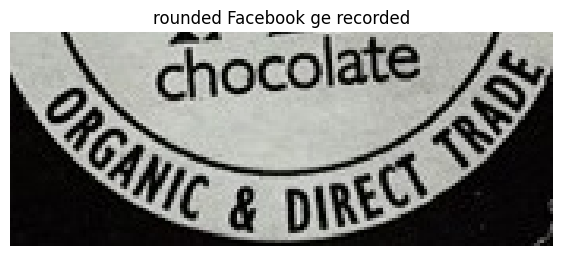

  2%|▏         | 30/1651 [00:13<07:17,  3.71it/s]

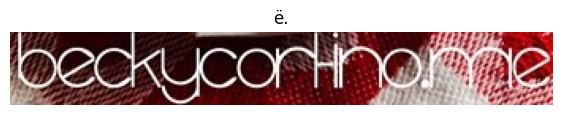

  2%|▏         | 31/1651 [00:13<07:11,  3.76it/s]

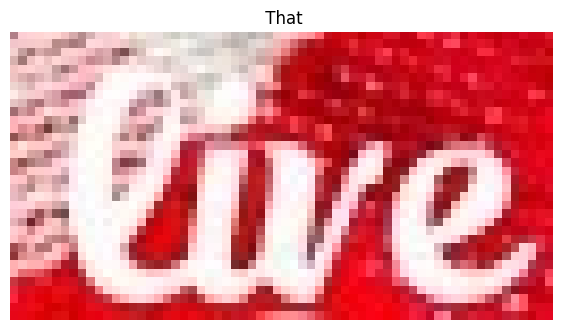

  2%|▏         | 32/1651 [00:13<07:07,  3.78it/s]

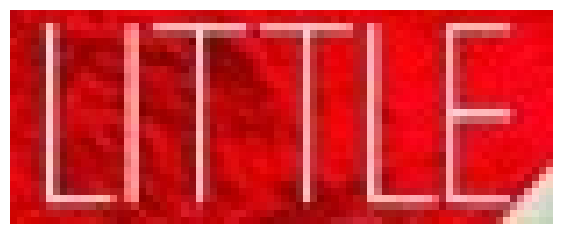

  2%|▏         | 33/1651 [00:13<06:33,  4.11it/s]

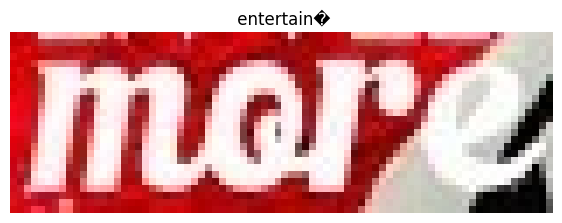

  2%|▏         | 34/1651 [00:14<06:31,  4.13it/s]

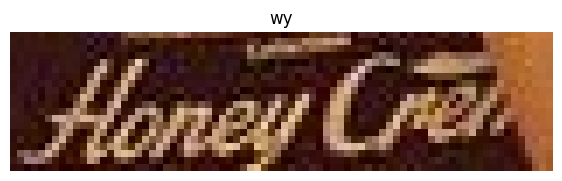

  2%|▏         | 35/1651 [00:14<06:23,  4.22it/s]

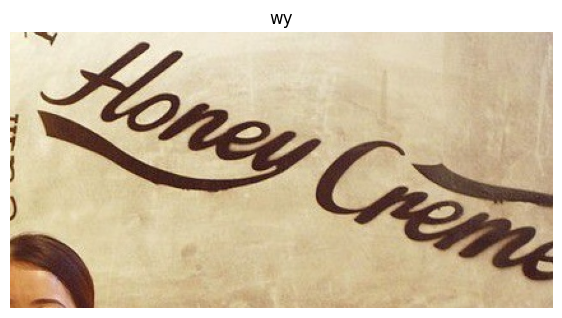

  2%|▏         | 36/1651 [00:14<06:44,  3.99it/s]

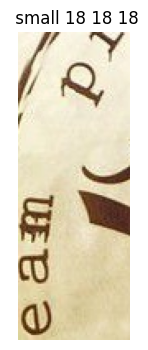

  2%|▏         | 37/1651 [00:14<06:57,  3.86it/s]

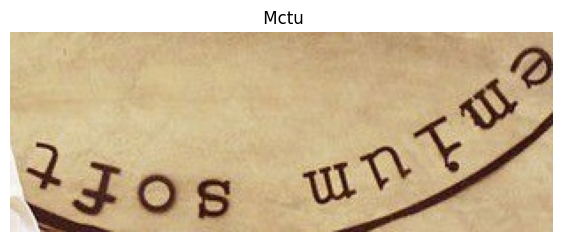

  2%|▏         | 38/1651 [00:15<07:23,  3.64it/s]

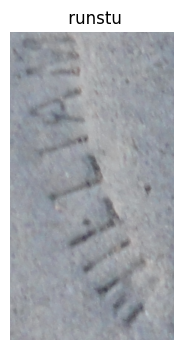

  2%|▏         | 39/1651 [00:15<07:51,  3.42it/s]

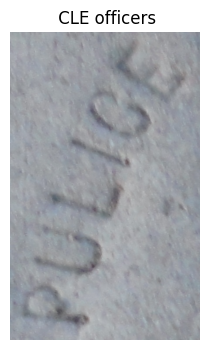

  2%|▏         | 40/1651 [00:15<08:04,  3.32it/s]

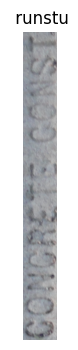

  2%|▏         | 41/1651 [00:16<08:24,  3.19it/s]

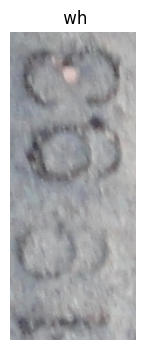

  3%|▎         | 42/1651 [00:16<08:01,  3.34it/s]

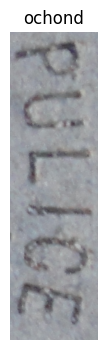

  3%|▎         | 43/1651 [00:16<08:20,  3.21it/s]

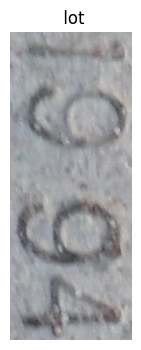

  3%|▎         | 44/1651 [00:17<13:33,  1.98it/s]

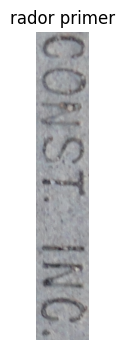

  3%|▎         | 45/1651 [00:17<11:33,  2.32it/s]

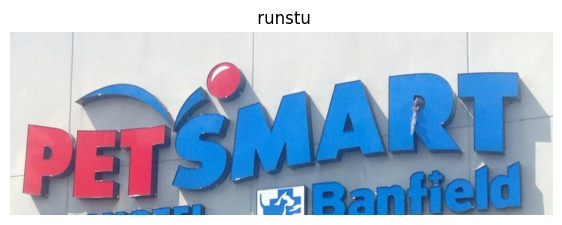

  3%|▎         | 46/1651 [00:18<10:21,  2.58it/s]

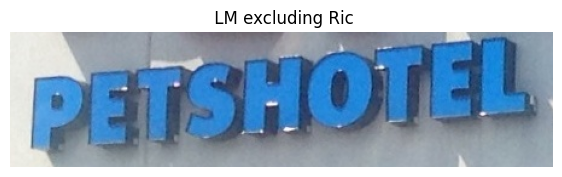

  3%|▎         | 47/1651 [00:18<09:08,  2.92it/s]

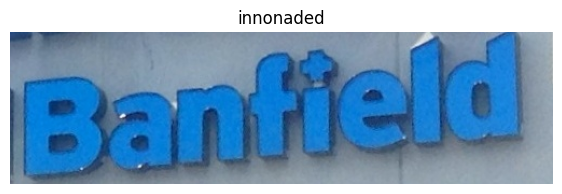

  3%|▎         | 48/1651 [00:18<08:10,  3.27it/s]

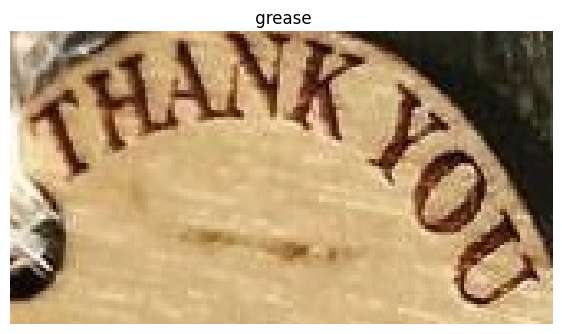

  3%|▎         | 49/1651 [00:19<08:09,  3.27it/s]

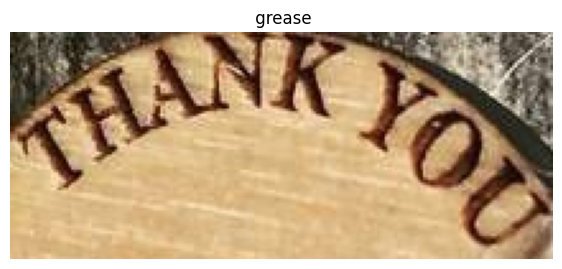

  3%|▎         | 50/1651 [00:19<08:01,  3.32it/s]

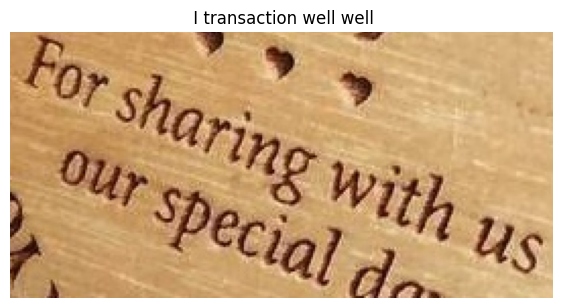

  3%|▎         | 51/1651 [00:19<08:29,  3.14it/s]

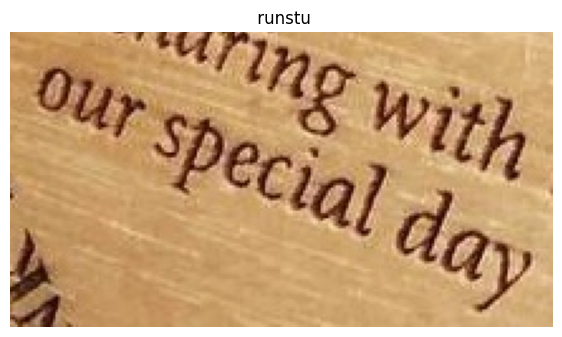

  3%|▎         | 52/1651 [00:20<08:50,  3.01it/s]

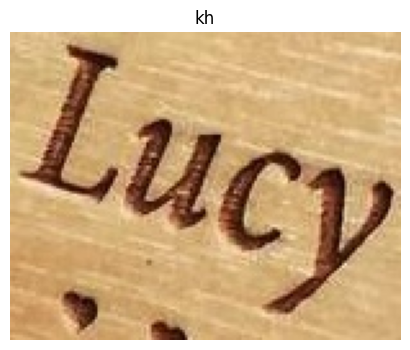

  3%|▎         | 53/1651 [00:20<08:48,  3.02it/s]

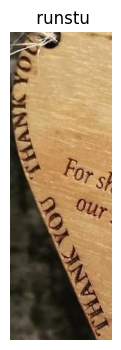

  3%|▎         | 54/1651 [00:20<08:58,  2.96it/s]

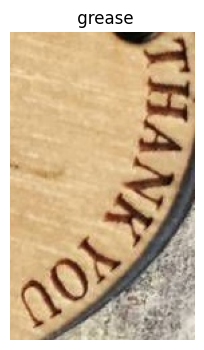

  3%|▎         | 55/1651 [00:20<08:02,  3.31it/s]

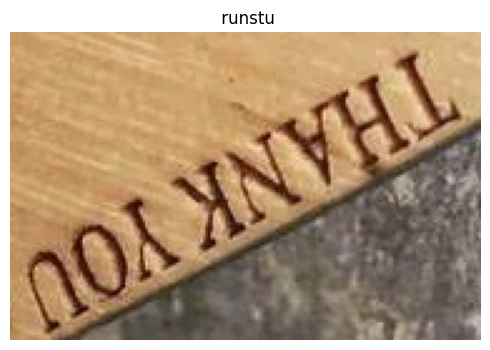

  3%|▎         | 56/1651 [00:21<08:24,  3.16it/s]

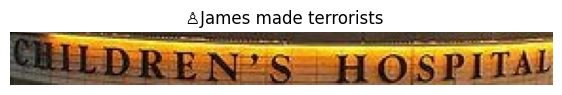

  3%|▎         | 57/1651 [00:21<08:15,  3.22it/s]

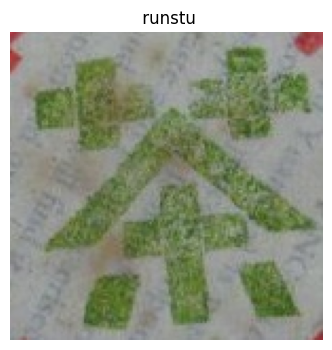

  4%|▎         | 58/1651 [00:21<07:45,  3.42it/s]

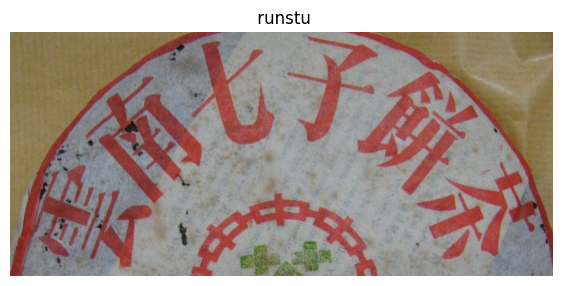

  4%|▎         | 59/1651 [00:22<07:35,  3.49it/s]

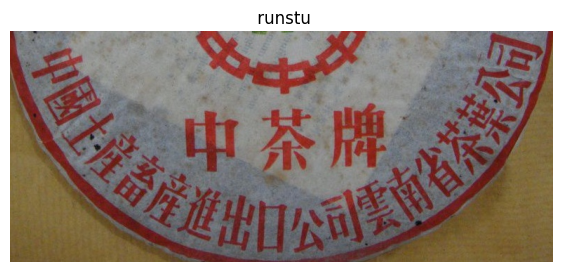

  4%|▎         | 60/1651 [00:22<08:03,  3.29it/s]

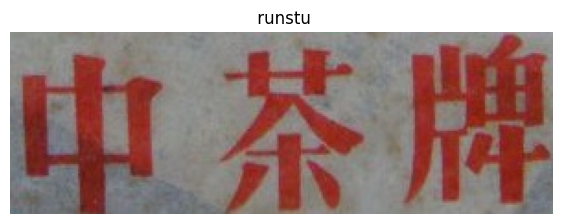

  4%|▎         | 61/1651 [00:22<08:00,  3.31it/s]

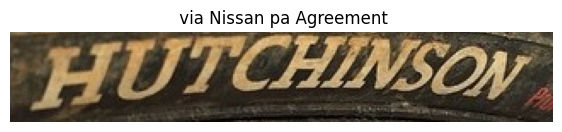

  4%|▍         | 62/1651 [00:23<07:40,  3.45it/s]

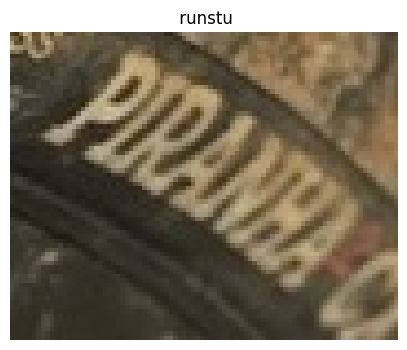

  4%|▍         | 63/1651 [00:23<07:02,  3.76it/s]

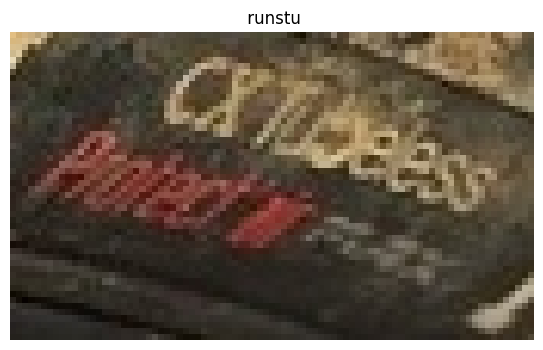

  4%|▍         | 64/1651 [00:23<07:02,  3.76it/s]

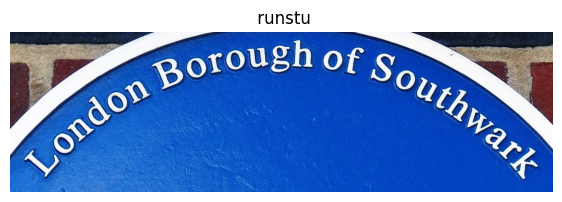

  4%|▍         | 65/1651 [00:23<07:40,  3.45it/s]

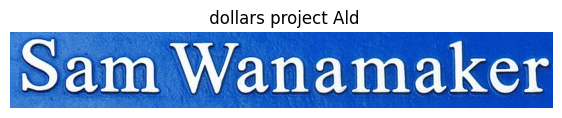

  4%|▍         | 66/1651 [00:24<07:29,  3.53it/s]

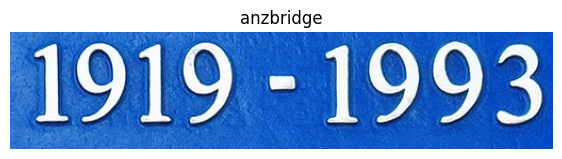

  4%|▍         | 67/1651 [00:24<06:52,  3.84it/s]

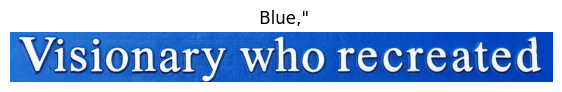

  4%|▍         | 68/1651 [00:24<07:40,  3.43it/s]

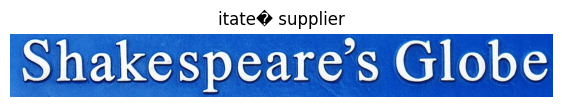

  4%|▍         | 69/1651 [00:24<07:21,  3.58it/s]

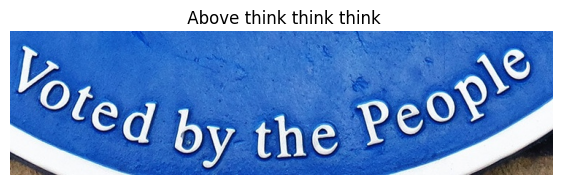

  4%|▍         | 70/1651 [00:25<07:30,  3.51it/s]

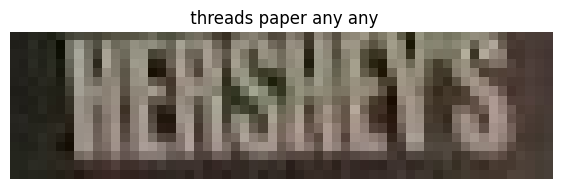

  4%|▍         | 71/1651 [00:25<07:31,  3.50it/s]

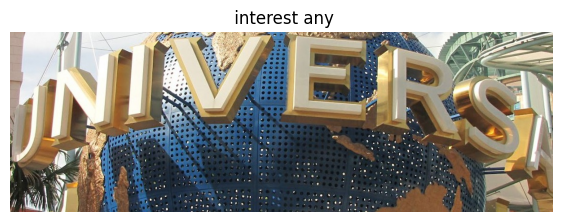

  4%|▍         | 72/1651 [00:25<07:31,  3.50it/s]

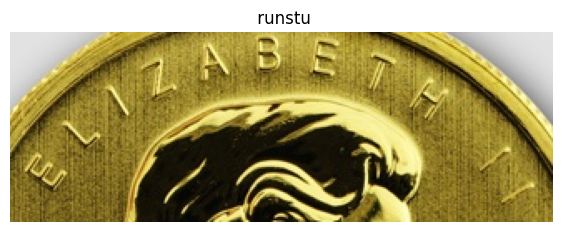

  4%|▍         | 73/1651 [00:26<07:10,  3.66it/s]

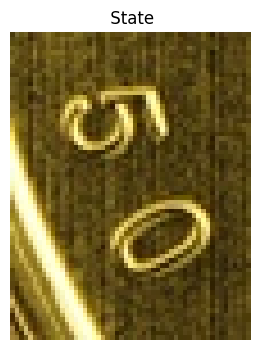

  4%|▍         | 74/1651 [00:26<06:36,  3.98it/s]

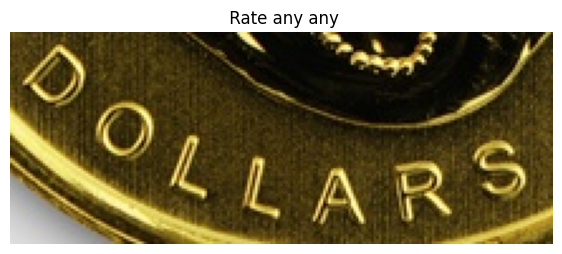

  5%|▍         | 75/1651 [00:26<07:10,  3.66it/s]

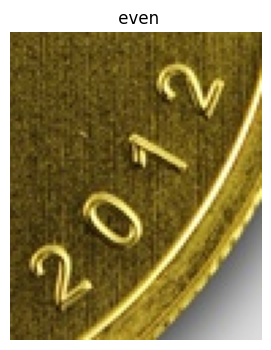

  5%|▍         | 76/1651 [00:26<06:58,  3.77it/s]

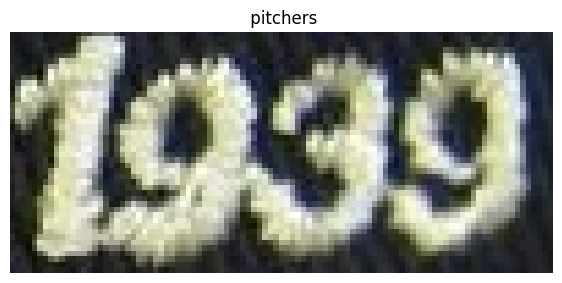

  5%|▍         | 77/1651 [00:26<06:13,  4.22it/s]

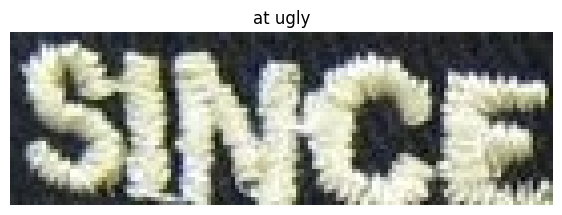

  5%|▍         | 78/1651 [00:27<05:50,  4.49it/s]

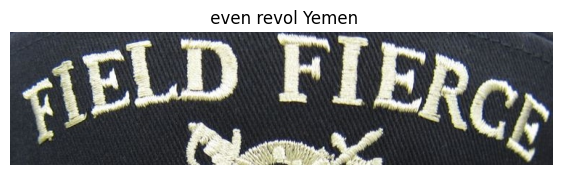

  5%|▍         | 79/1651 [00:27<06:19,  4.15it/s]

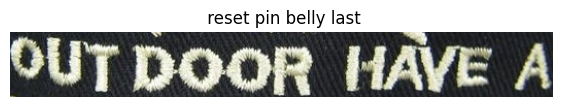

  5%|▍         | 80/1651 [00:27<06:26,  4.07it/s]

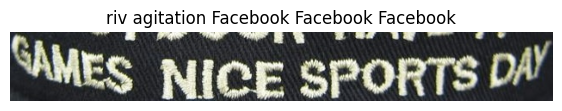

  5%|▍         | 81/1651 [00:28<06:52,  3.80it/s]

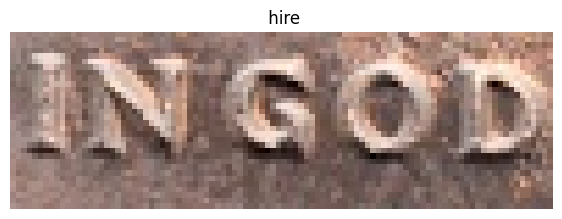

  5%|▍         | 82/1651 [00:28<06:52,  3.80it/s]

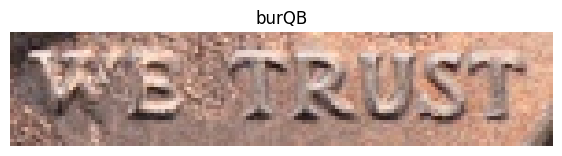

  5%|▌         | 83/1651 [00:28<06:13,  4.19it/s]

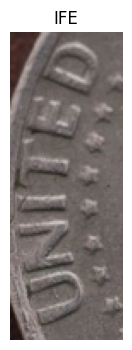

  5%|▌         | 84/1651 [00:28<06:07,  4.26it/s]

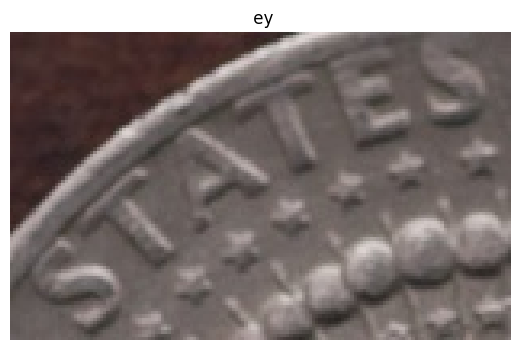

  5%|▌         | 85/1651 [00:28<06:05,  4.29it/s]

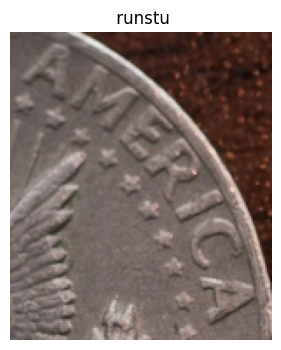

  5%|▌         | 86/1651 [00:29<06:07,  4.26it/s]

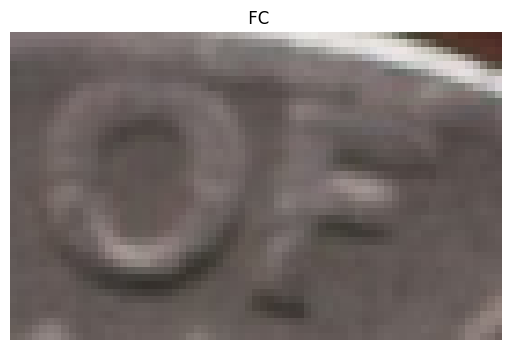

  5%|▌         | 87/1651 [00:29<06:19,  4.12it/s]

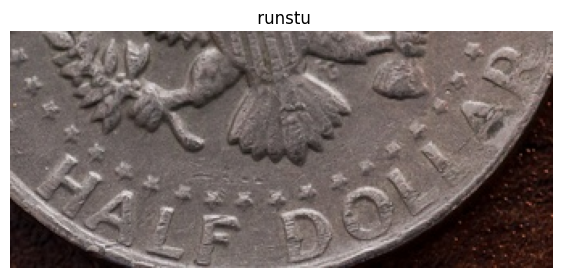

  5%|▌         | 88/1651 [00:29<06:42,  3.88it/s]

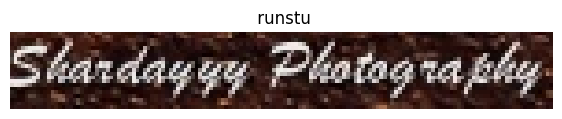

  5%|▌         | 89/1651 [00:29<06:50,  3.81it/s]

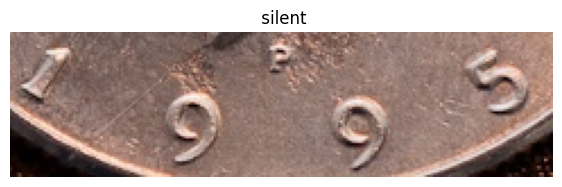

  5%|▌         | 90/1651 [00:30<06:51,  3.79it/s]

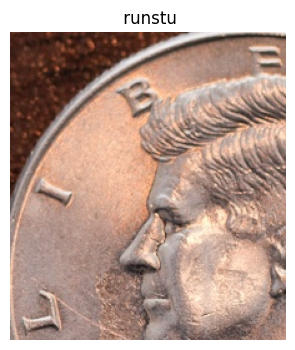

  6%|▌         | 91/1651 [00:30<06:34,  3.95it/s]

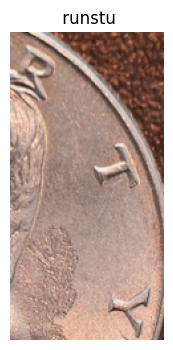

  6%|▌         | 92/1651 [00:30<06:13,  4.17it/s]

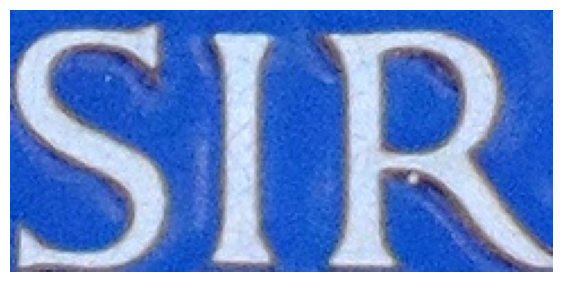

  6%|▌         | 93/1651 [00:30<06:18,  4.11it/s]

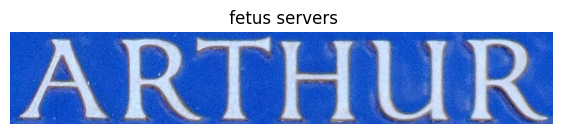

  6%|▌         | 94/1651 [00:31<06:06,  4.25it/s]

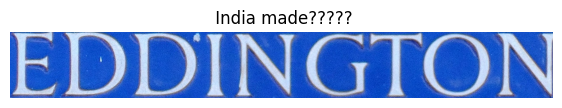

  6%|▌         | 95/1651 [00:31<06:36,  3.92it/s]

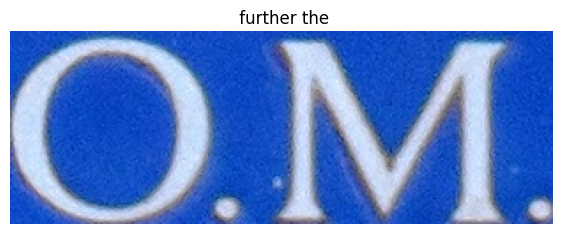

  6%|▌         | 96/1651 [00:31<07:04,  3.66it/s]

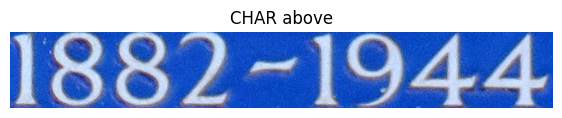

  6%|▌         | 97/1651 [00:32<07:03,  3.67it/s]

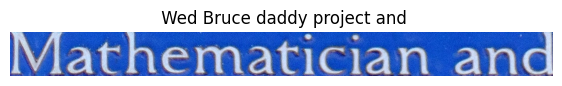

  6%|▌         | 98/1651 [00:32<07:53,  3.28it/s]

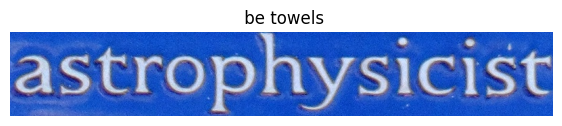

  6%|▌         | 99/1651 [00:32<07:31,  3.44it/s]

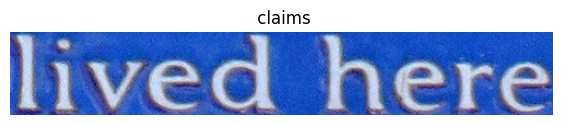

  6%|▌         | 100/1651 [00:32<08:30,  3.04it/s]


In [ ]:
eval_new_data(
    data_path=os.path.join(DatasetConfig.DATA_ROOT, 'scut_test', '*'),
    num_samples=100
)

In [ ]:
# FINAL_DIR = "trocr_curved_finetuned"

# trainer.model.save_pretrained(FINAL_DIR)
# processor.save_pretrained(FINAL_DIR)



from sklearn.metrics import accuracy_score
accuracy_score(ytest,predict)